<a href="https://colab.research.google.com/github/rex-yue-wu/DEC-Keras/blob/master/ManTraNet-Demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ManTra-Net: Manipulation Tracing Network For Detection and Localization of Image Forgeries With Anomalous Features

## This is a simple demonstrative notebook for the pretrained ManTra-Net

## Note:

- Please make sure you run this notebook with the GPU support. You may see tensorflow errors when decoding images of very large sizes, e.g. 2048x3072.
- All lib/data paths used in this notebook is relative. In case you run this notebook outside of its original location, please fix the data paths.

# 1. Download the ManTraNet Repo

In [1]:
#!rm -rf ManTraNet
#!git clone https://github.com/ISICV/ManTraNet.git


# 2. Import Dependent Libs and Set Paths

In [2]:
import os
import numpy as np 
import cv2
import requests
import sys

from PIL import Image
from io import BytesIO
from matplotlib import pyplot


In [3]:
manTraNet_root = './ManTraNet/'
manTraNet_srcDir = os.path.join( manTraNet_root, 'src' )
sys.path.insert( 0, manTraNet_srcDir )
manTraNet_modelDir = os.path.join( manTraNet_root, 'pretrained_weights' )

# 3. Load Sample Data 

In [4]:
manTraNet_dataDir = os.path.join( manTraNet_root, 'data' )
manTraNet_imagesDir = os.path.join( manTraNet_dataDir, 'images' )

images_list = os.listdir(manTraNet_imagesDir)
images_path = []
for image_dir in images_list:
    #print(image_dir)
    image_path = os.path.join( manTraNet_imagesDir, image_dir.strip())
    #print(image_path)
    images_path.append(image_path)

#images_path.remove("./ManTraNet/data/images/.DS_Store")
#for test in images_path:
#    print(test)
#sample_file = os.path.join( manTraNet_dataDir, 'samplePairs.csv' )
#assert os.path.isfile( sample_file ), "ERROR: can NOT find sample data, check `manTraNet_root`"
#with open( sample_file ) as IN :
#    sample_pairs = [line.strip() for line in IN.readlines() ]
L = len(images_path)
print("INFO: in total, load", L, "samples")
    
def get_a_random_pair() :
    idx = np.random.randint(0,L)
    return ( os.path.join( manTraNet_dataDir, this ) for this in sample_pairs[idx] ) 
def get_a_pair(n) :    
    return ( os.path.join( manTraNet_dataDir, this ) for this in sample_pairs[n] ) 

('INFO: in total, load', 81, 'samples')


# 4. Load A Pretrained ManTraNet Model

In [5]:
import modelCore
manTraNet = modelCore.load_pretrain_model_by_index( 4, manTraNet_modelDir )

Using TensorFlow backend.


INFO: use activation in the last CONV=None
INFO: unfreeze feature extraction part, trainable=True


In [6]:
# ManTraNet Architecture 
#print(manTraNet.summary(line_length=120))

In [7]:
# Image Manipulation Classification Network
IMCFeatex = manTraNet.get_layer('Featex')
#print(IMCFeatex.summary(line_length=120))

# 5. Play With The Provided Sample Data

## Note: we don't need original image files for forgery detection. They are included here to demonstrate the effectiveness of the ManTra-Net.


In [8]:
from datetime import datetime 
def read_rgb_image( image_file ) :
    rgb = cv2.imread( image_file, 1 )[...,::-1]
    return rgb
    
def decode_an_image_array( rgb, manTraNet ) :
    x = np.expand_dims( rgb.astype('float32')/255.*2-1, axis=0 )
    t0 = datetime.now()
    y = manTraNet.predict(x)[0,...,0]
    t1 = datetime.now()
    return y, t1-t0

def decode_an_image_file( image_file, manTraNet ) :
    rgb = read_rgb_image( image_file )
    mask, ptime = decode_an_image_array( rgb, manTraNet )
    return rgb, mask, ptime.total_seconds()

0
./ManTraNet/data/images/FARC0008.jpg


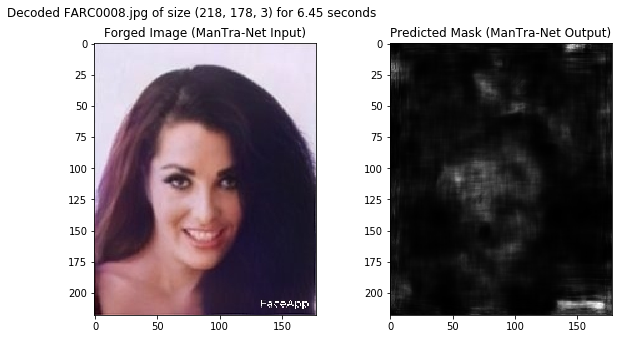

1
./ManTraNet/data/images/RC0006.jpg


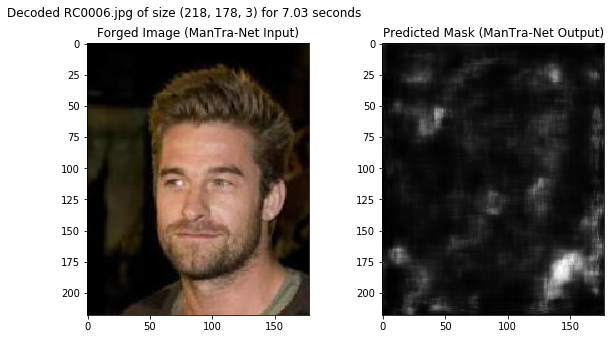

2
./ManTraNet/data/images/RC0007.jpg


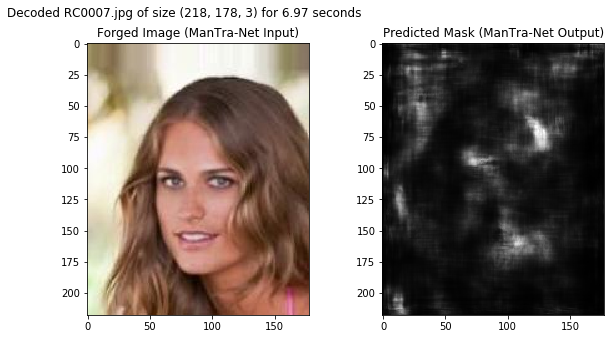

3
./ManTraNet/data/images/FARC0009.jpg


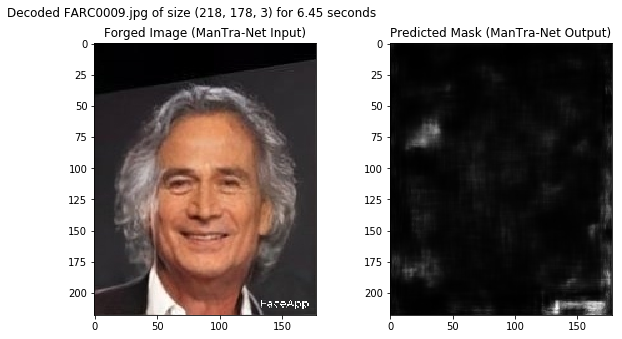

4
./ManTraNet/data/images/DFL00054.jpg


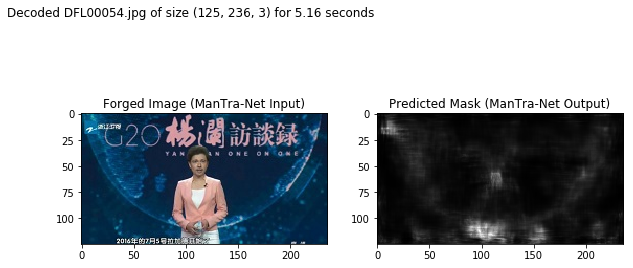

5
./ManTraNet/data/images/DFL00054.png


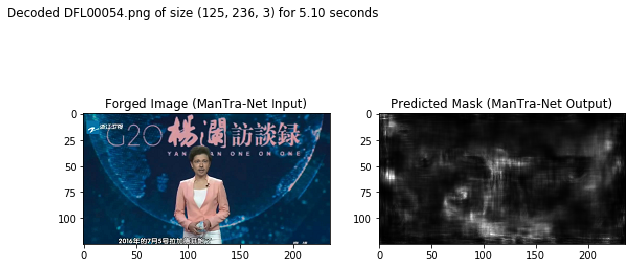

6
./ManTraNet/data/images/RC0005.jpg


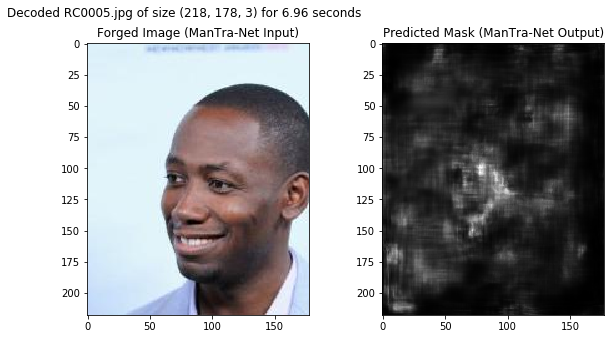

7
./ManTraNet/data/images/RC0011.jpg


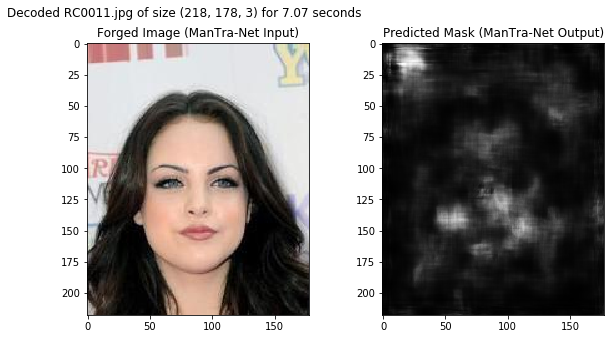

8
./ManTraNet/data/images/RC0010.jpg


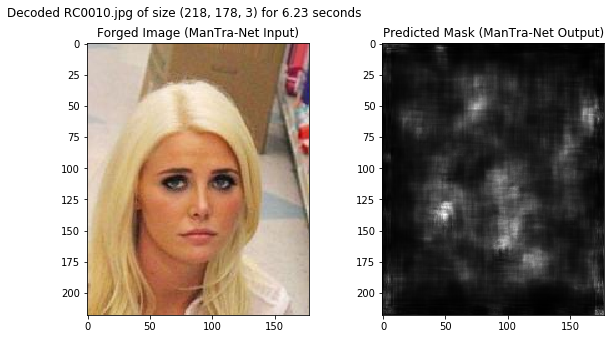

9
./ManTraNet/data/images/RC0004.jpg


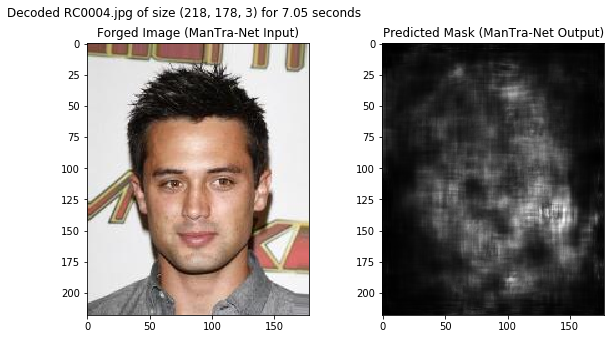

10
./ManTraNet/data/images/DFL00045.jpg


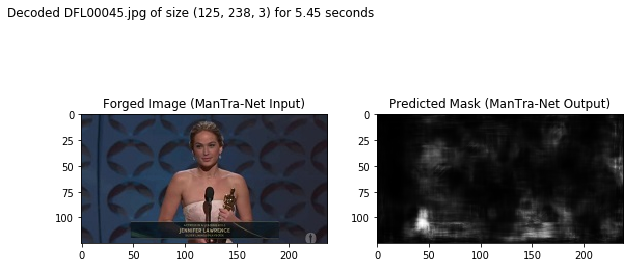

11
./ManTraNet/data/images/RDFL00009.png


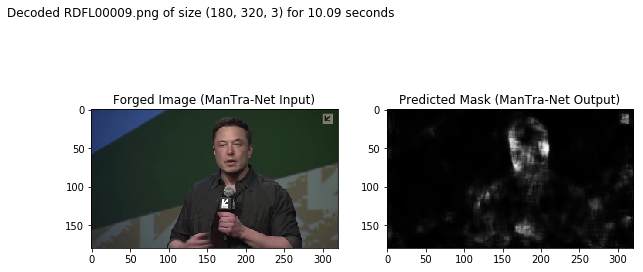

12
./ManTraNet/data/images/DFL00045.png


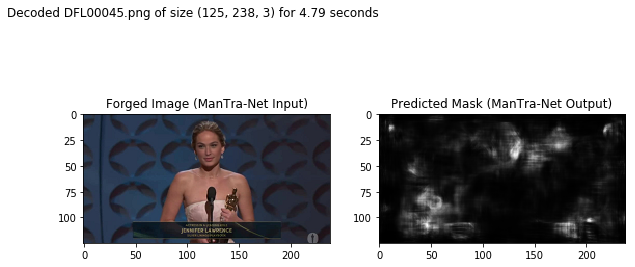

13
./ManTraNet/data/images/RDFL00009.jpg


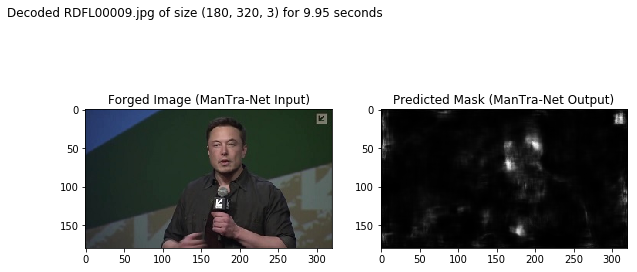

14
./ManTraNet/data/images/RC0001.jpg


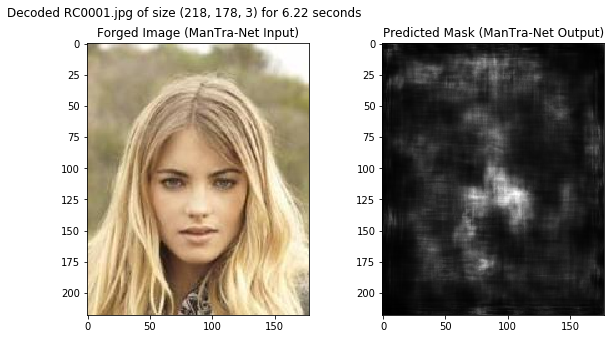

15
./ManTraNet/data/images/TPNE0008.jpg


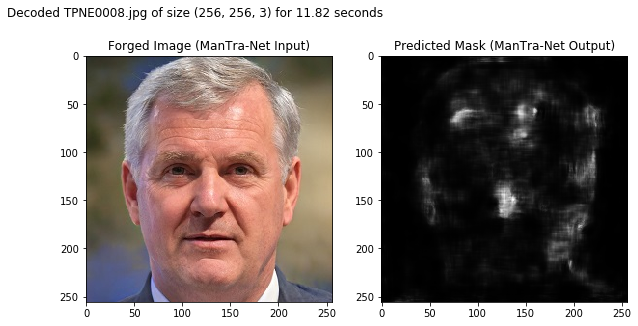

16
./ManTraNet/data/images/RC0003.jpg


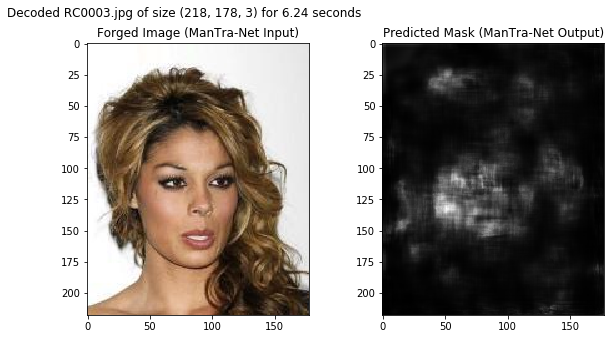

17
./ManTraNet/data/images/RC0002.jpg


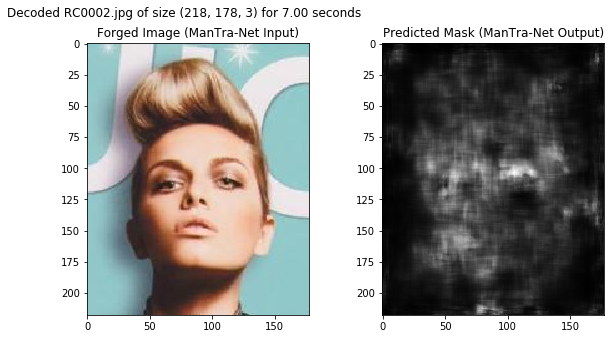

18
./ManTraNet/data/images/TPNE0009.jpg


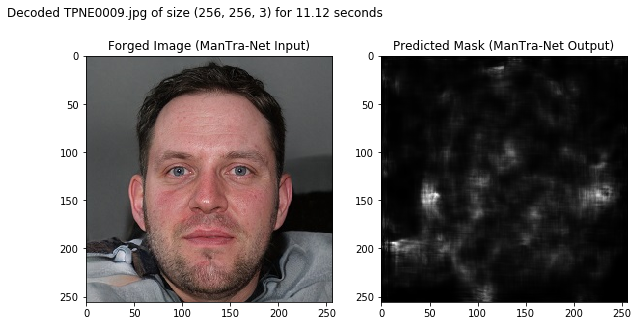

19
./ManTraNet/data/images/D0004.png


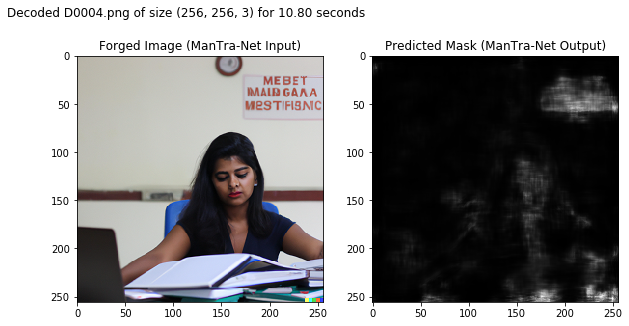

20
./ManTraNet/data/images/D0004.jpg


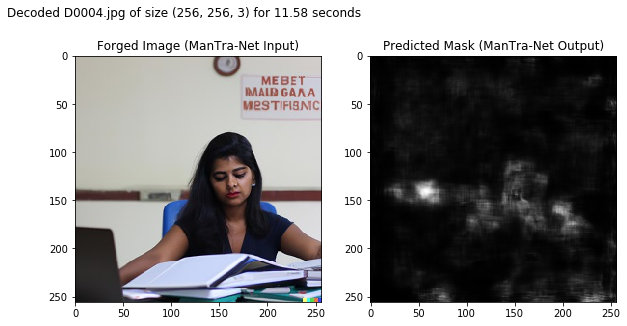

21
./ManTraNet/data/images/DFL00020.jpg


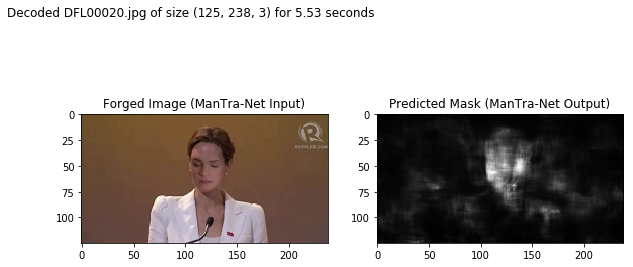

22
./ManTraNet/data/images/DFL00020.png


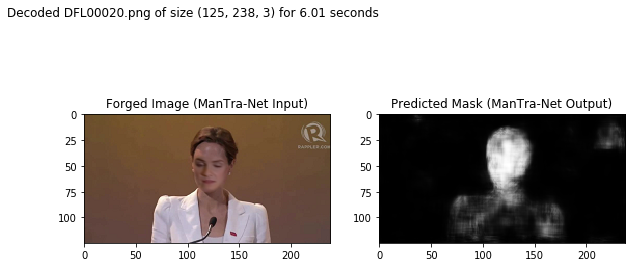

23
./ManTraNet/data/images/RCV00027.jpg


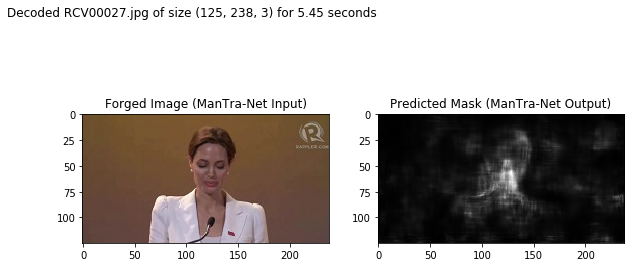

24
./ManTraNet/data/images/DFL00009.png


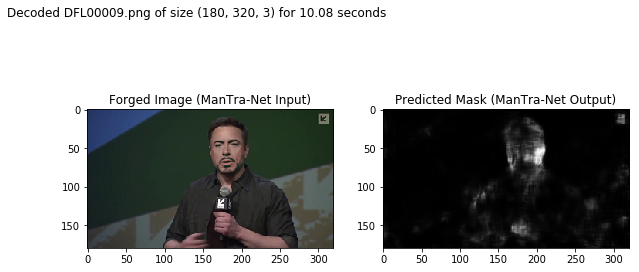

25
./ManTraNet/data/images/DFL00009.jpg


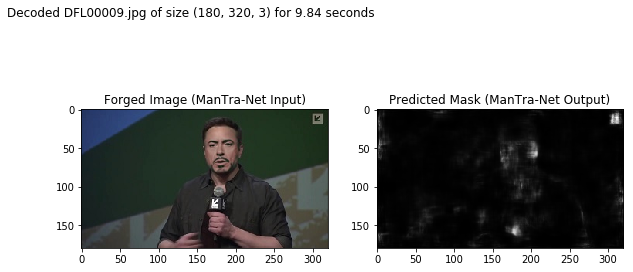

26
./ManTraNet/data/images/D0005.jpg


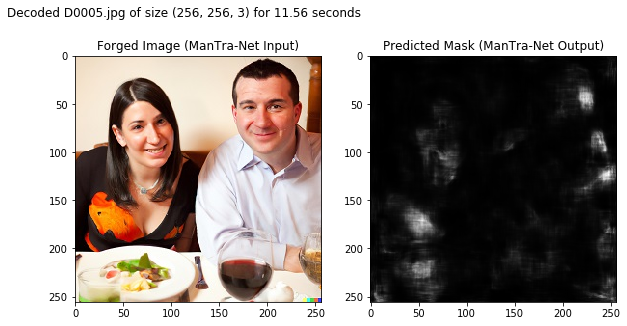

27
./ManTraNet/data/images/D0005.png


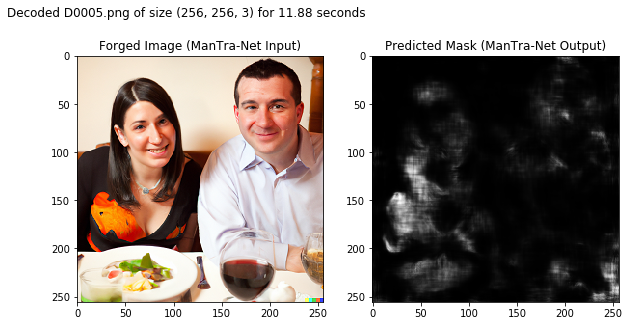

28
./ManTraNet/data/images/D0007.png


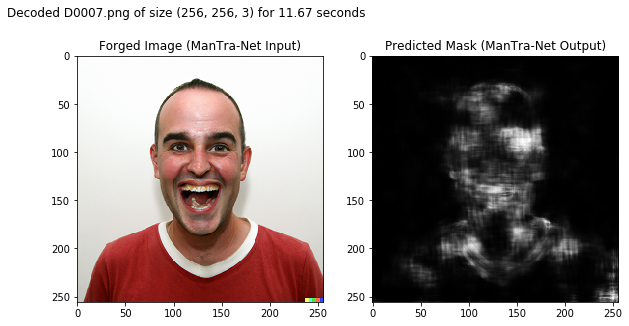

29
./ManTraNet/data/images/FA0004.jpg


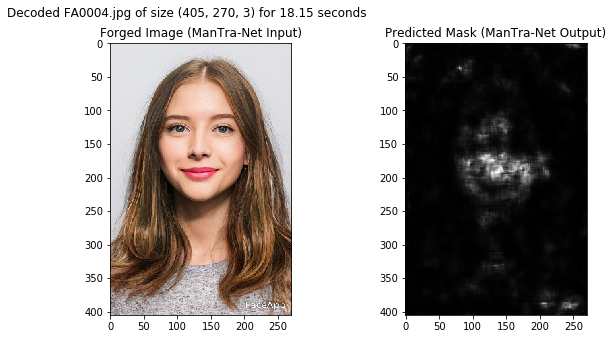

30
./ManTraNet/data/images/D0007.jpg


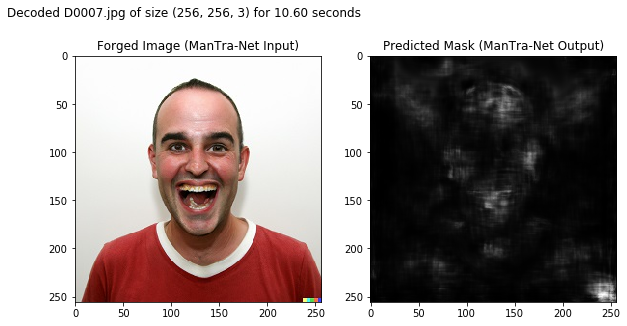

31
./ManTraNet/data/images/RCV00025.jpg


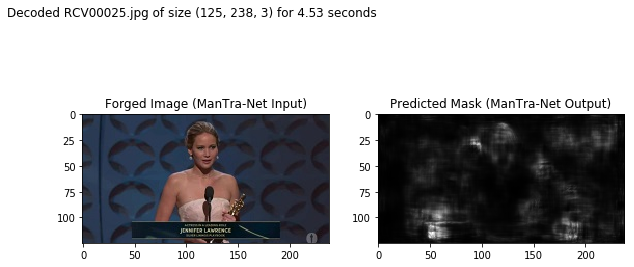

32
./ManTraNet/data/images/D0006.jpg


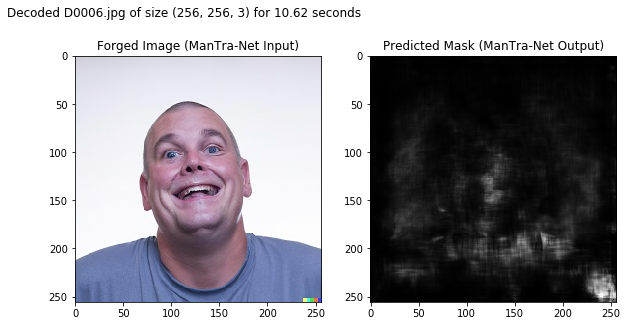

33
./ManTraNet/data/images/DFL00354.png


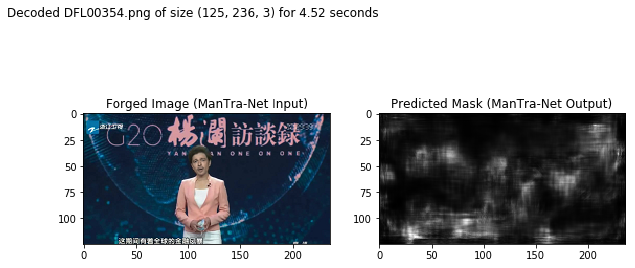

34
./ManTraNet/data/images/DFL00354.jpg


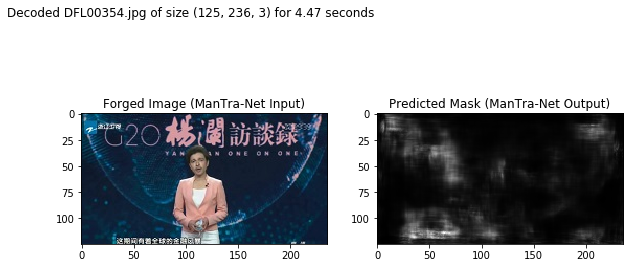

35
./ManTraNet/data/images/D0006.png


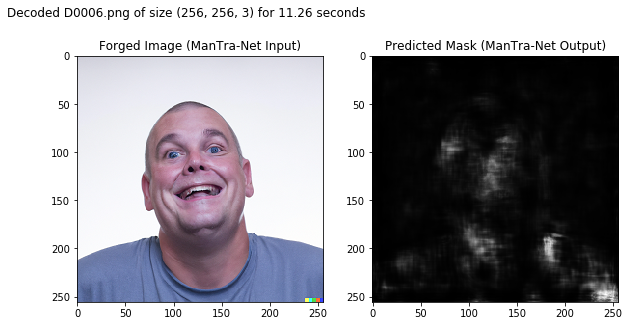

36
./ManTraNet/data/images/D0002.png


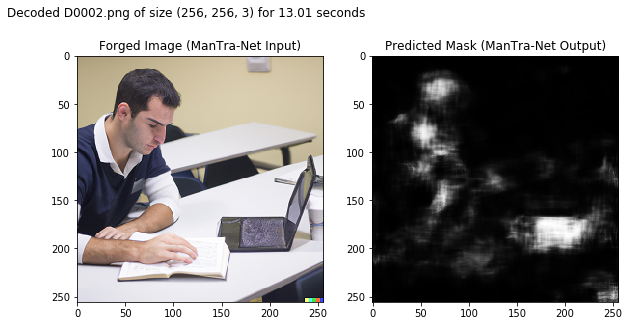

37
./ManTraNet/data/images/FA0001.jpg


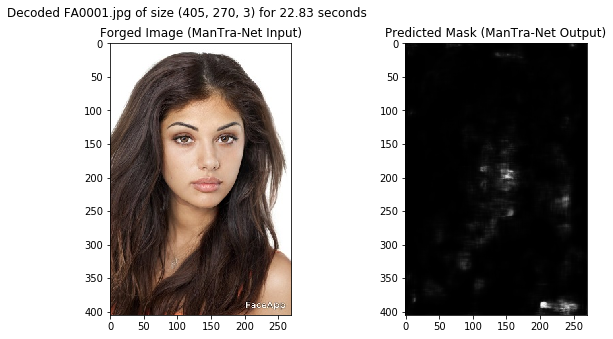

38
./ManTraNet/data/images/D0002.jpg


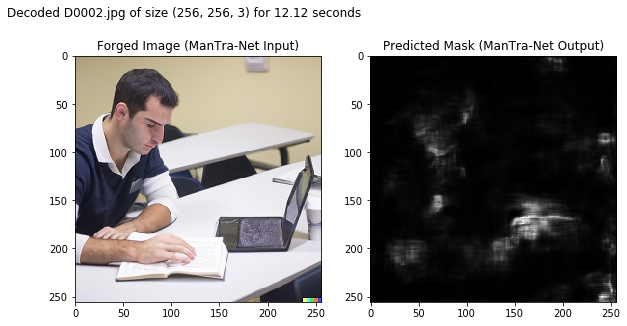

39
./ManTraNet/data/images/D0003.jpg


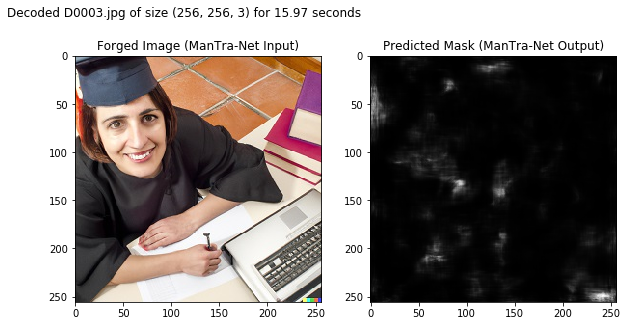

40
./ManTraNet/data/images/D0003.png


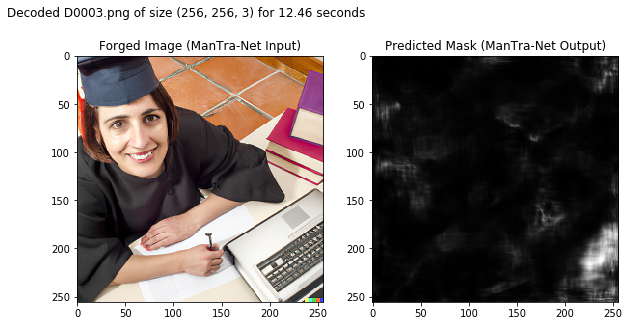

41
./ManTraNet/data/images/D0001.png


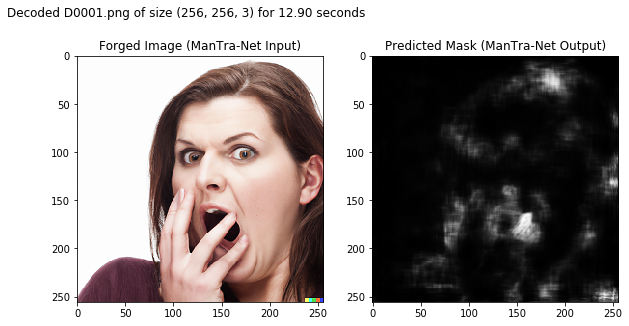

42
./ManTraNet/data/images/D0001.jpg


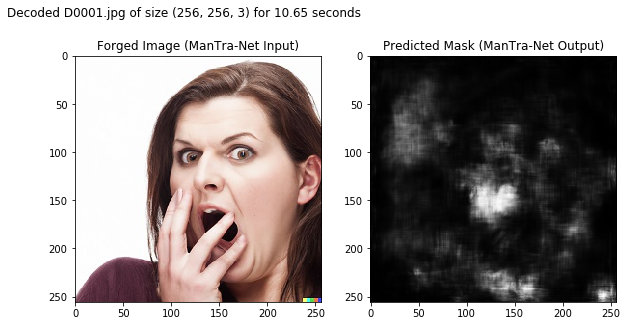

43
./ManTraNet/data/images/FA0002.jpg


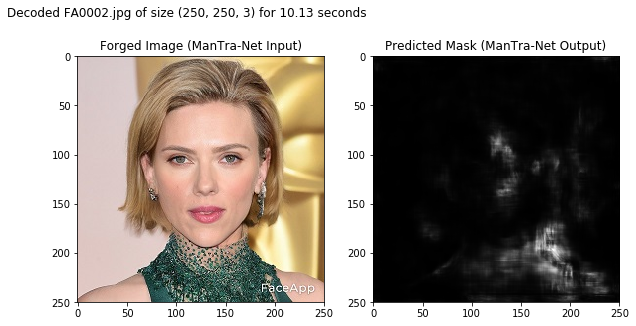

44
./ManTraNet/data/images/DFL00025.jpg


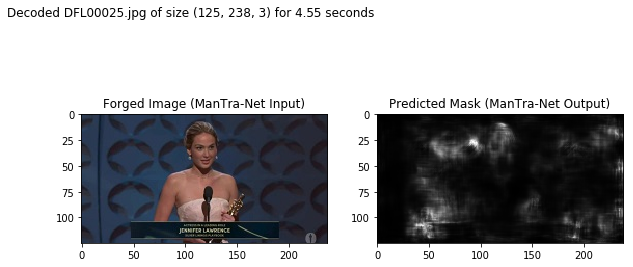

45
./ManTraNet/data/images/DFL00025.png


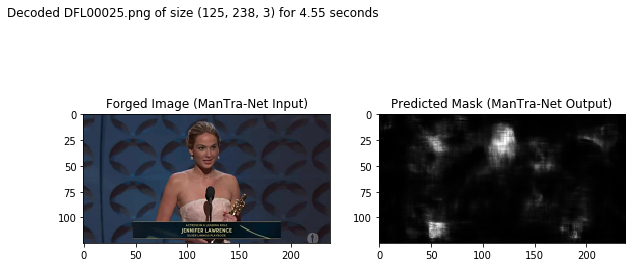

46
./ManTraNet/data/images/FA0003.jpg


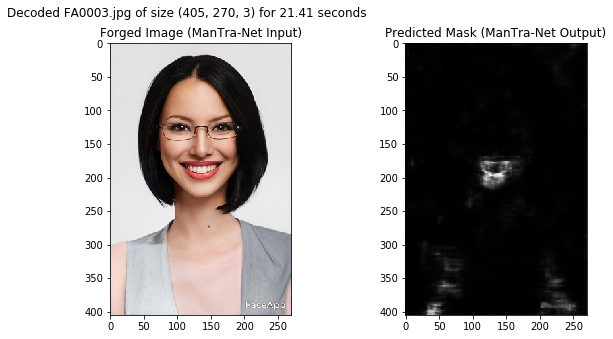

47
./ManTraNet/data/images/RCV00354.jpg


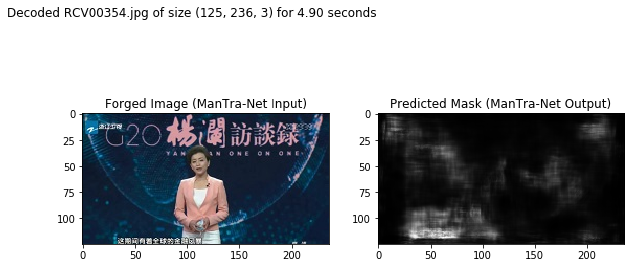

48
./ManTraNet/data/images/RCV00010.jpg


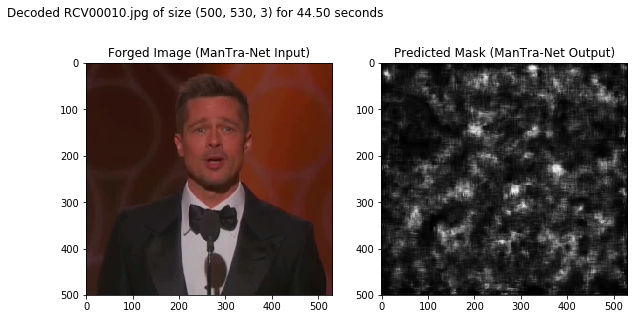

49
./ManTraNet/data/images/DFL00013.jpg


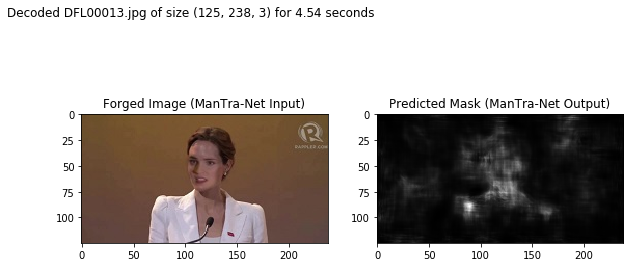

50
./ManTraNet/data/images/DFL00013.png


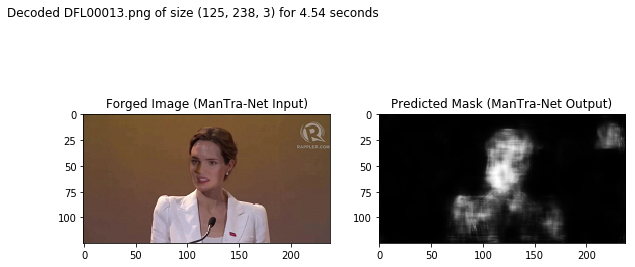

51
./ManTraNet/data/images/RCV00015.jpg


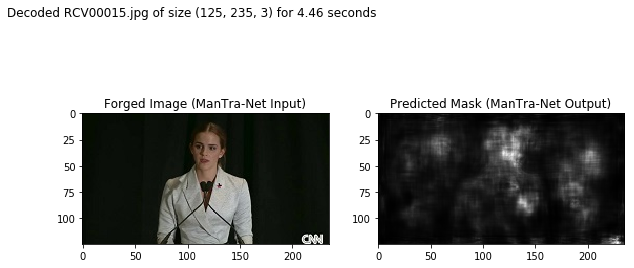

52
./ManTraNet/data/images/DFL00006.png


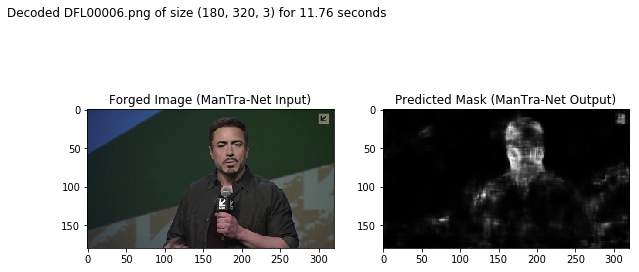

53
./ManTraNet/data/images/DFL00006.jpg


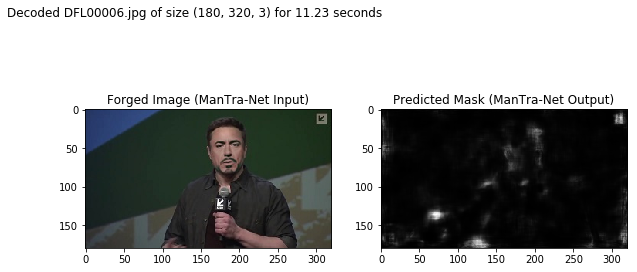

54
./ManTraNet/data/images/D0008.png


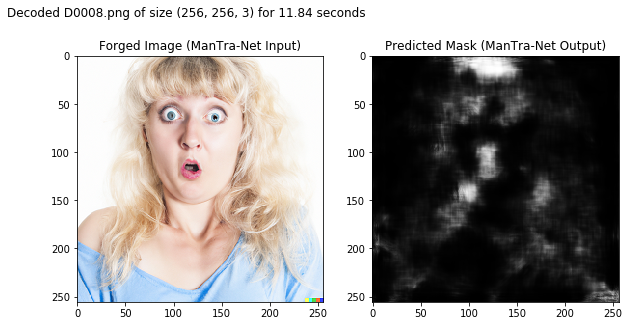

55
./ManTraNet/data/images/D0008.jpg


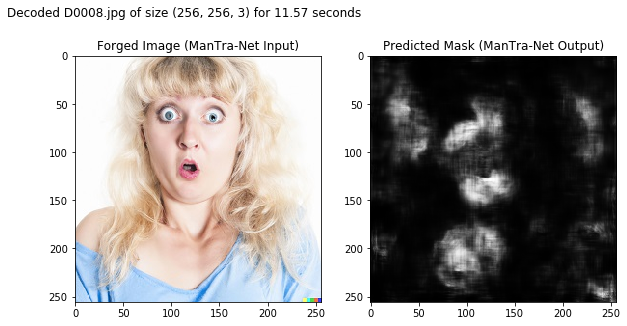

56
./ManTraNet/data/images/D0009.jpg


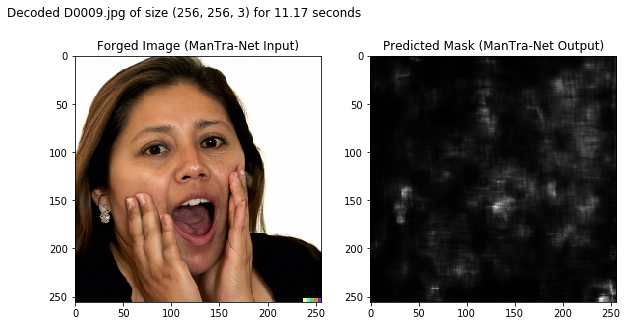

57
./ManTraNet/data/images/D0009.png


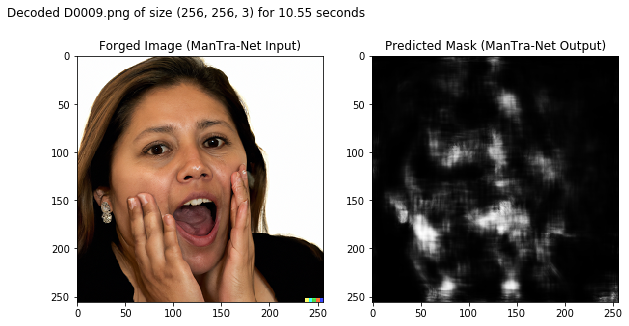

58
./ManTraNet/data/images/TPNE0004.jpg


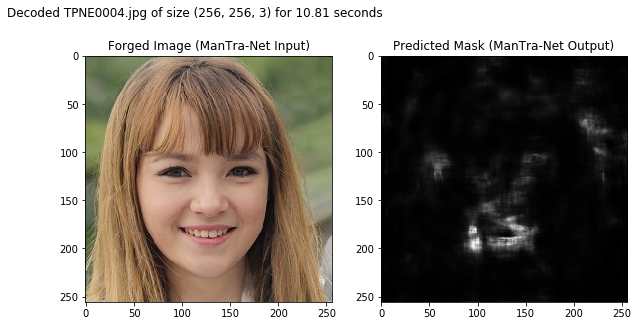

59
./ManTraNet/data/images/FARC0001.jpg


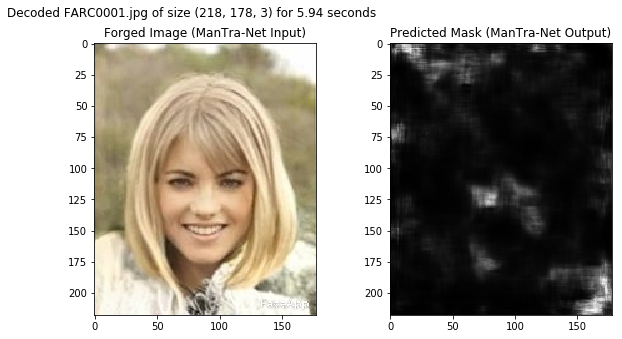

60
./ManTraNet/data/images/TPNE0005.jpg


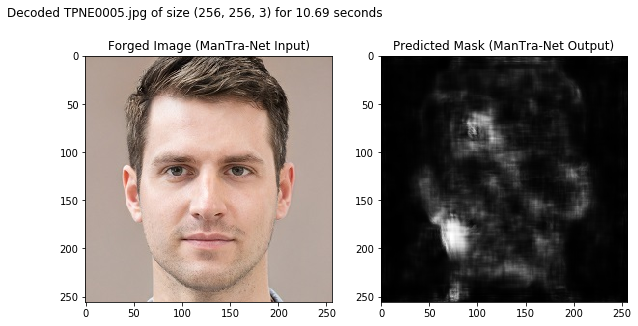

61
./ManTraNet/data/images/TPNE0007.jpg


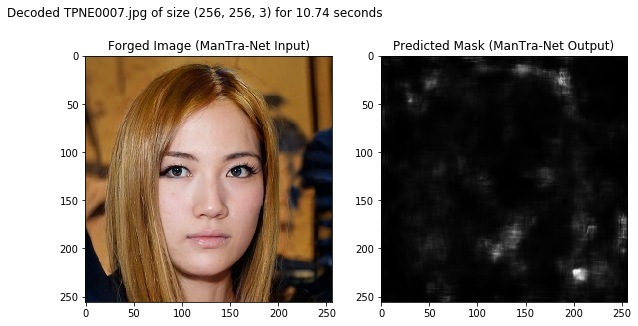

62
./ManTraNet/data/images/FARC0002.jpg


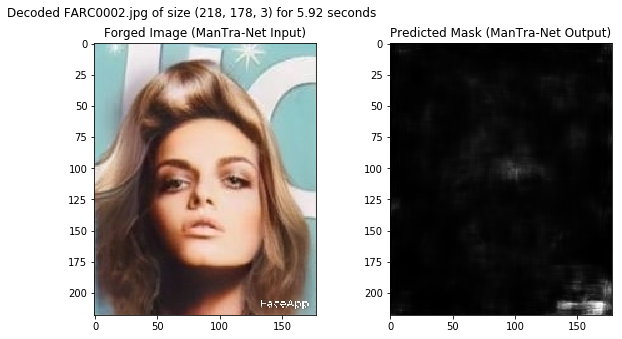

63
./ManTraNet/data/images/RDFL00011.png


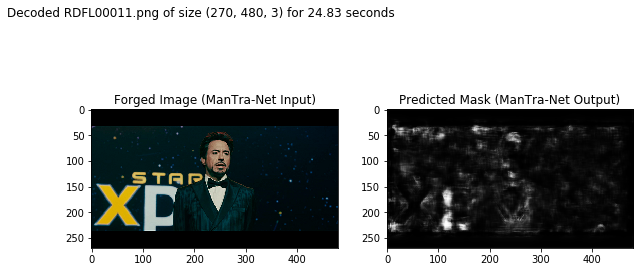

64
./ManTraNet/data/images/RDFL00011.jpg


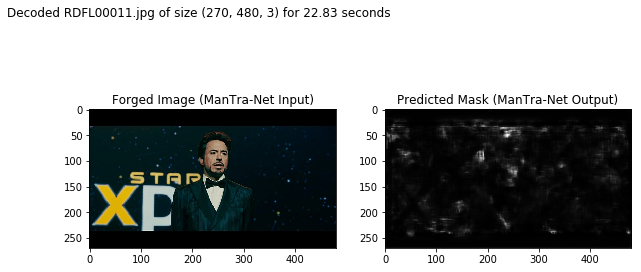

65
./ManTraNet/data/images/FARC0003.jpg


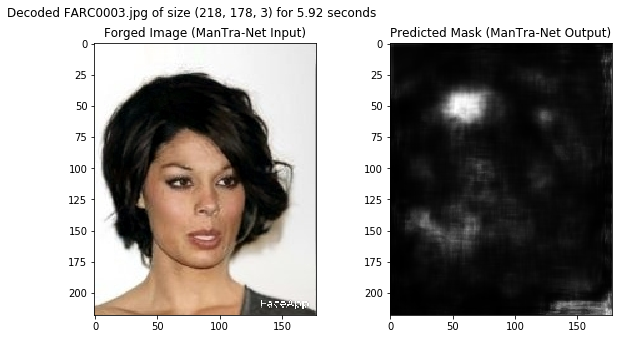

66
./ManTraNet/data/images/D00010.png


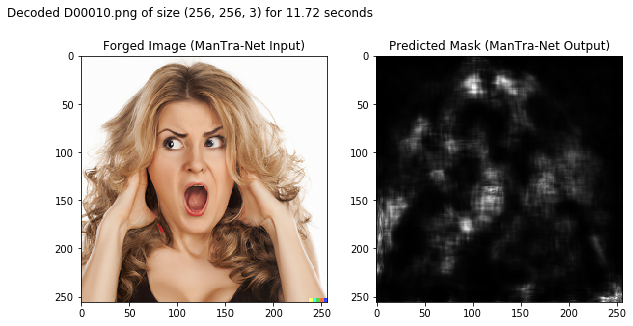

67
./ManTraNet/data/images/TPNE0006.jpg


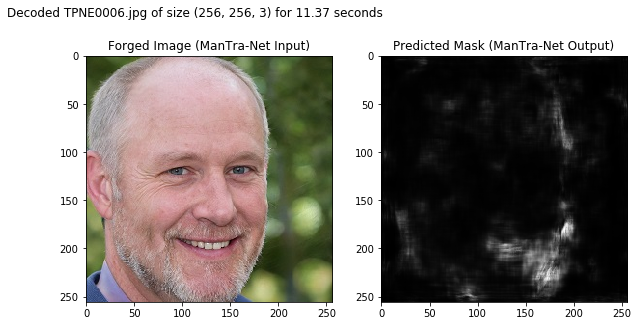

68
./ManTraNet/data/images/D00010.jpg


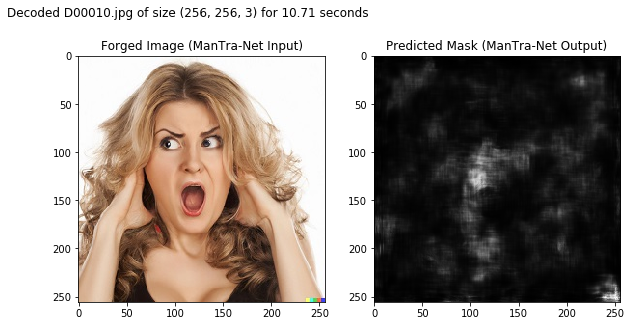

69
./ManTraNet/data/images/TPNE0002.jpg


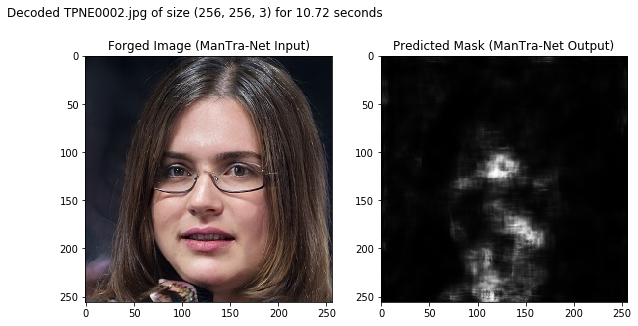

70
./ManTraNet/data/images/FARC0007.jpg


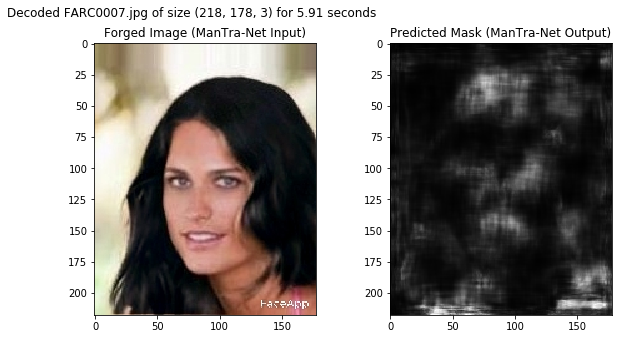

71
./ManTraNet/data/images/RC0009.jpg


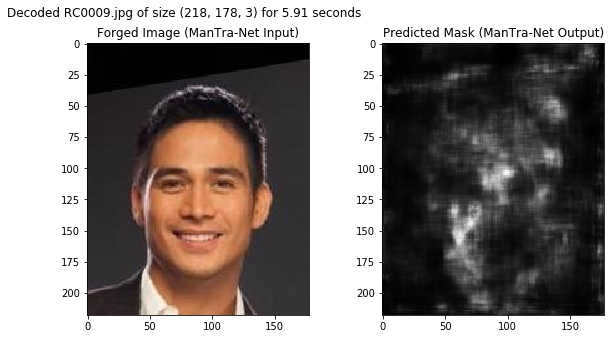

72
./ManTraNet/data/images/RC0008.jpg


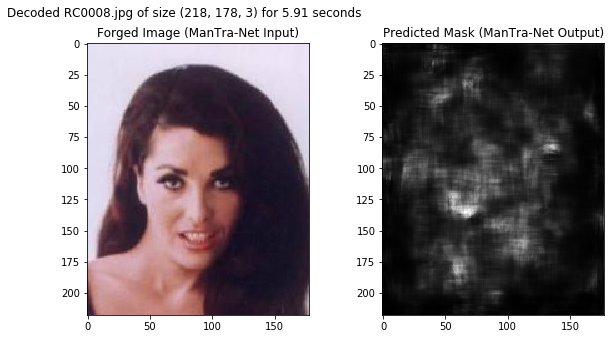

73
./ManTraNet/data/images/FARC0006.jpg


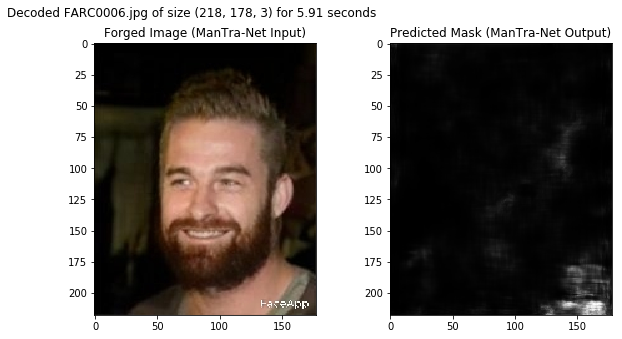

74
./ManTraNet/data/images/TPNE0003.jpg


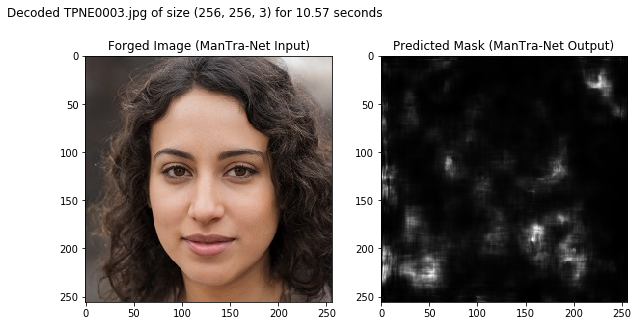

75
./ManTraNet/data/images/TPNE0001.jpg


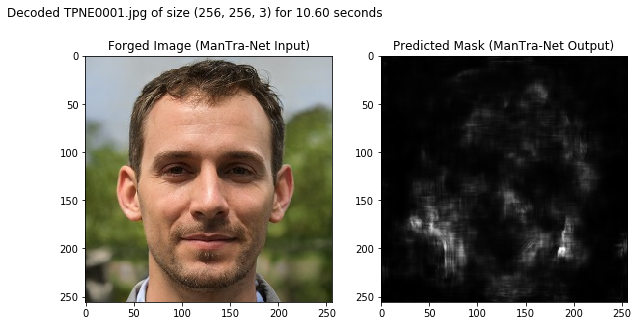

76
./ManTraNet/data/images/FARC0010.jpg


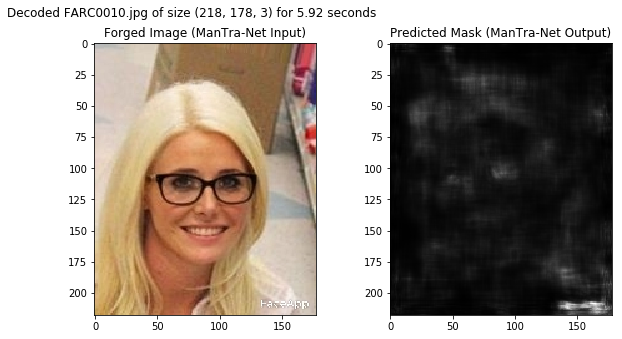

77
./ManTraNet/data/images/FARC0004.jpg


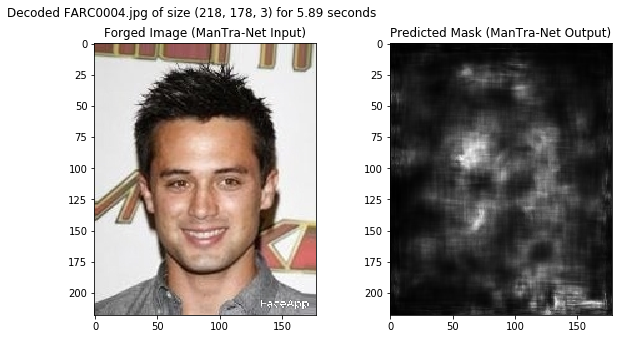

78
./ManTraNet/data/images/RCV00277.jpg


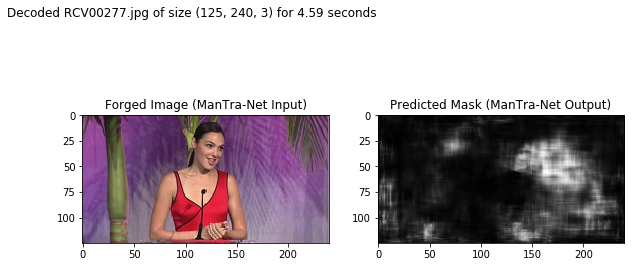

79
./ManTraNet/data/images/FARC0005.jpg


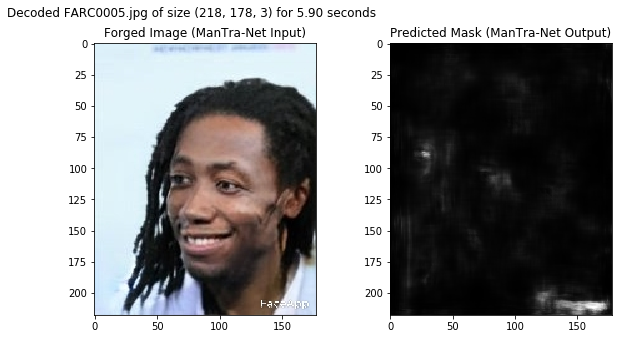

80
./ManTraNet/data/images/FARC0011.jpg


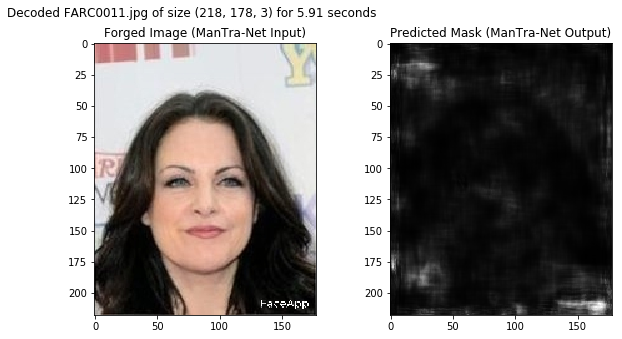

In [9]:
for k in range(L) :
    # get a sample
    print(k)
    print(images_path[k])
    #forged_file, original_file = get_a_random_pair()
    #forged_file, original_file = get_a_pair(k)
    forged_file =  images_path[k]
    # load the original image just for reference
    #ori = read_rgb_image( original_file )
    # manipulation detection using ManTraNet
    rgb, mask, ptime = decode_an_image_file( forged_file, manTraNet ) 
    # show results
    pyplot.figure( figsize=(15,5) )
    #pyplot.subplot(131)
    #pyplot.imshow( ori )
    #pyplot.title('Original Image')
    pyplot.subplot(132)
    pyplot.imshow( rgb )
    pyplot.title('Forged Image (ManTra-Net Input)')
    pyplot.subplot(133)
    pyplot.imshow( mask, cmap='gray' )
    pyplot.title('Predicted Mask (ManTra-Net Output)')
    pyplot.suptitle('Decoded {} of size {} for {:.2f} seconds'.format( os.path.basename( forged_file ), rgb.shape, ptime ) )
    pyplot.show()